# Preprocesamiento de imágenes

In [ ]:
import sys
import os

# Agrega la raíz del proyecto al path
project_root = os.path.abspath(os.path.join(os.getcwd(), ".."))
if project_root not in sys.path:
    sys.path.insert(0, project_root)

In [ ]:
# Importación de librerías
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2


# Importación librerías personalizadas
from scripts.prep_auxiliares_v3 import (
    recortar_tanque,      # HoughCircles + desplazamiento
    eliminar_timestamp,   # pintado negro de la zona de timestamp
    balance_clahe,        # balance de blancos + CLAHE
    quitar_sombras,       # máscara HSV + morfología
    segmentar_peces,      # umbrales HSV/LAB + morfología
    separar_watershed     # Watershed + fallback
)
from scripts.prep_ver_imagenes import visualize_preprocessing_samples
from scripts.prep_cuantitativa import visualize_preprocessing_with_coverage, compute_coverage_direct
from scripts.prep_save_dataset import preprocess_and_save_dataset


### Establecimiento de hiperparámetros dinámicos

In [2]:
label_csv="../data/labels2_kmeans_limpio.csv"

hp = {
    # 1) Recorte del tanque
    "desplazar_arriba":        60,                # +60 px para no cortar peces altos
    # 2) Eliminación de timestamp
    "timestamp_rect":          (0, 0, 200,  5),  # tapa sólo la zona del timestamp, 200×80 px  
    # 3) CLAHE
    "clahe_clip_limit":        3.0,
    "clahe_tile_grid_size":    (8, 8),
    # 4) Rangos de color para segmentar peces
    #    LAB: umbral_L más bajo y delta_ab más ancho para incluir peces oscuros
    "lab_ranges": [
        # (Lmin, Lmax, a_min, a_max, b_min, b_max)
        (120, 255, 128-30, 128+30, 128-30, 128+30)
    ],
    #    HSV: mismos rangos que tenías para peces naranjas/grises/negros
    "hsv_ranges": [
        # (Hmin,Smin,Vmin, Hmax,Smax,Vmax)
        (0,   60,  60,   30, 255, 255),   # naranjas
        (150, 60,  60,  180, 255, 255)    # rojos intensos
    ],
    # 5) Filtrado de contornos y Watershed
    "min_contour_area":        30,    # descartar motas <30px
    "watershed_dist_thresh":    0.3,  # semillas más agresivas en Watershed
    # 6) Tamaño final
    "final_size":             (224, 224)
}

### Visualización de imágenes por números de clases

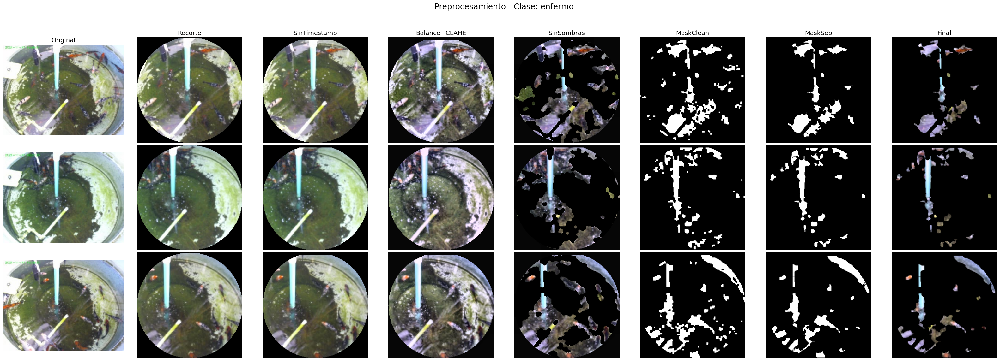

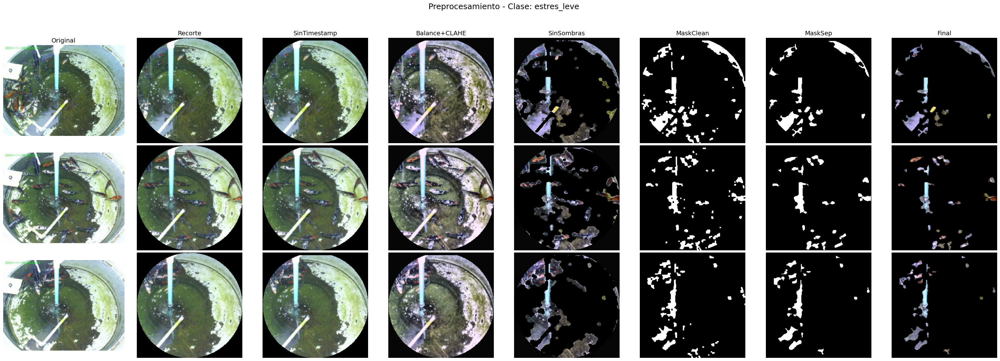

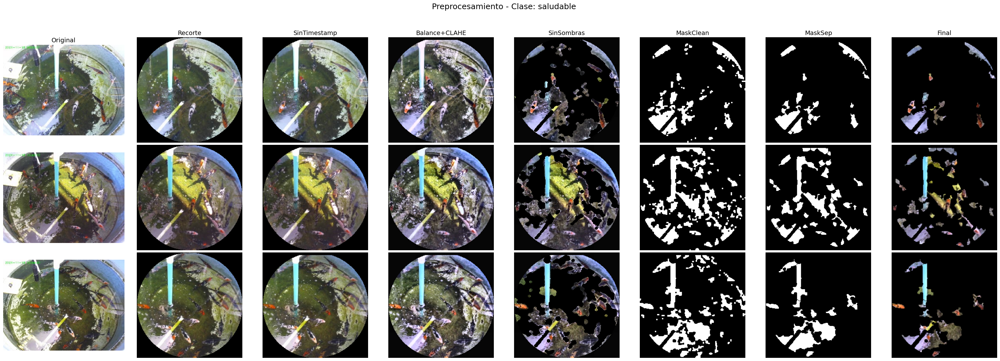

In [3]:
# Visualizar solamente tres ítems por clase
visualize_preprocessing_samples(
  label_csv=label_csv,
  raw_img_dir="../data/images",
  num_samples=3,
  desplazar_arriba=hp["desplazar_arriba"],
  timestamp_rect=hp["timestamp_rect"],
  clahe_clip_limit=hp["clahe_clip_limit"],
  clahe_tile_grid_size=hp["clahe_tile_grid_size"],
  hsv_ranges=hp["hsv_ranges"],
  lab_ranges=hp["lab_ranges"],
  min_contour_area=hp["min_contour_area"],
  watershed_dist_thresh=hp["watershed_dist_thresh"],
  final_size=hp["final_size"]
)

### Comparación cuantitativa de densidad de píxeles de pez por clase

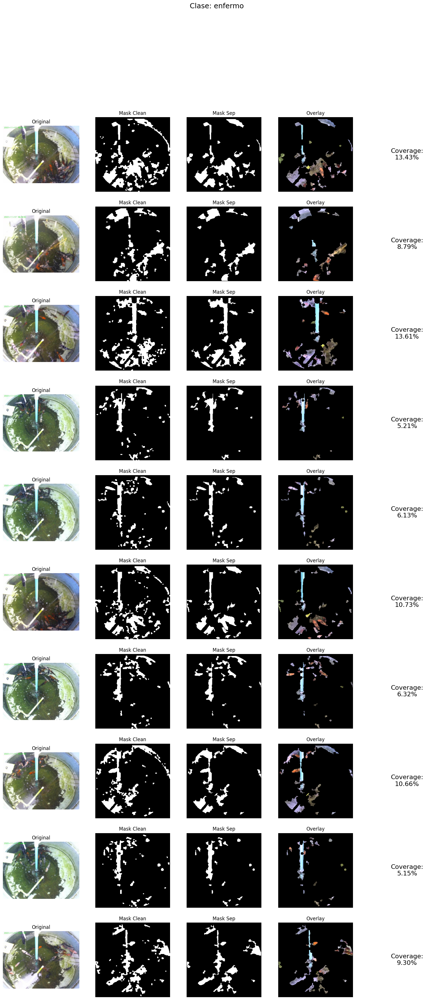

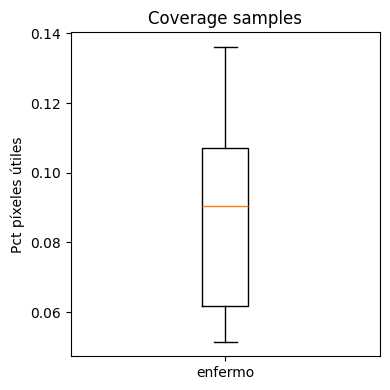

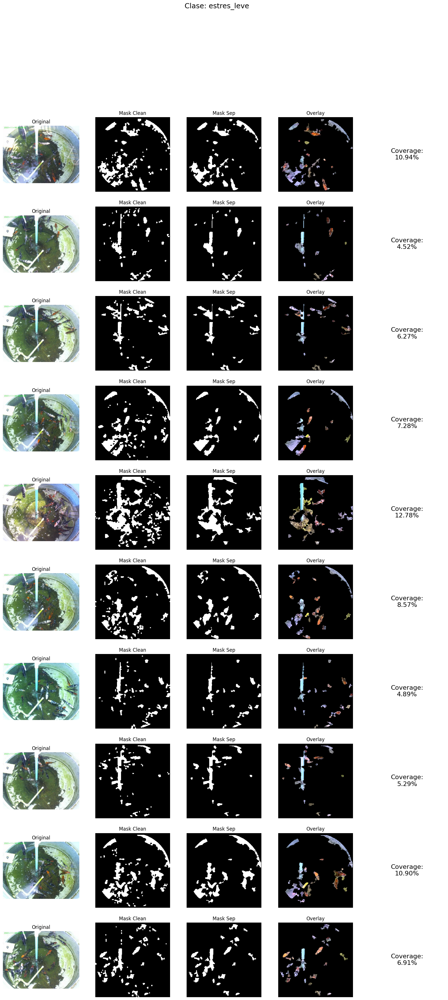

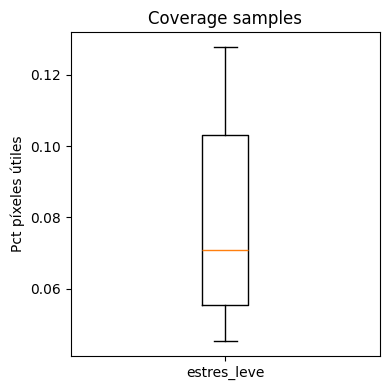

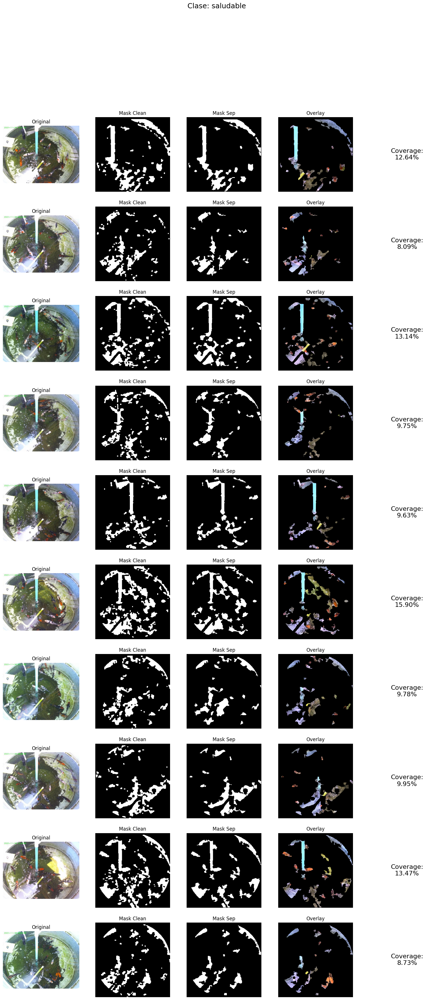

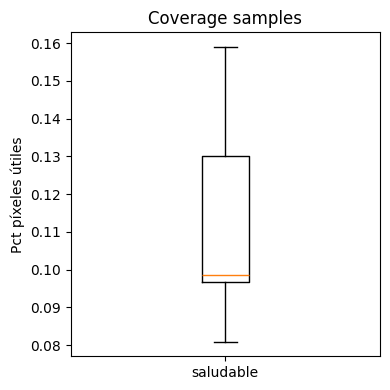

In [4]:
# Comparar cuantitativamente la densidad de píxeles de pez por clase 
# y validar el impacto de tus ajustes.

# Ejecutarlo así:
visualize_preprocessing_with_coverage(
    label_csv=label_csv,
    raw_img_dir="../data/images",
    num_samples=10,
    desplazar_arriba=hp["desplazar_arriba"],
    timestamp_rect=hp["timestamp_rect"],
    clahe_clip_limit=hp["clahe_clip_limit"],
    clahe_tile_grid_size=hp["clahe_tile_grid_size"],
    hsv_ranges=hp["hsv_ranges"],
    lab_ranges=hp["lab_ranges"],
    min_contour_area=hp["min_contour_area"],
    watershed_dist_thresh=hp["watershed_dist_thresh"],
    final_size=hp["final_size"]
)

### Análisis del coverage realizado

Calculando coverage:  71%|███████   | 10096/14185 [05:37<02:26, 27.90it/s]

⚠️ Error en 2021-11-18_09-47-13_10s.jpg: OpenCV(4.11.0) :-1: error: (-5:Bad argument) in function 'rectangle'
> Overload resolution failed:
>  - Layout of the output array img is incompatible with cv::Mat
>  - Layout of the output array img is incompatible with cv::Mat
>  - Expected Ptr<cv::UMat> for argument 'img'
>  - Expected Ptr<cv::UMat> for argument 'img'



Calculando coverage: 100%|██████████| 14185/14185 [08:15<00:00, 28.65it/s]


Cobertura por clase:
              count   mean    std    min    25%    50%    75%    max
class                                                               
enfermo      5769.0  0.092  0.029  0.038  0.064  0.095  0.114  0.197
estres_leve  3160.0  0.077  0.029  0.031  0.057  0.068  0.091  0.279
saludable    5255.0  0.110  0.027  0.050  0.092  0.104  0.121  0.254


<Figure size 800x600 with 0 Axes>

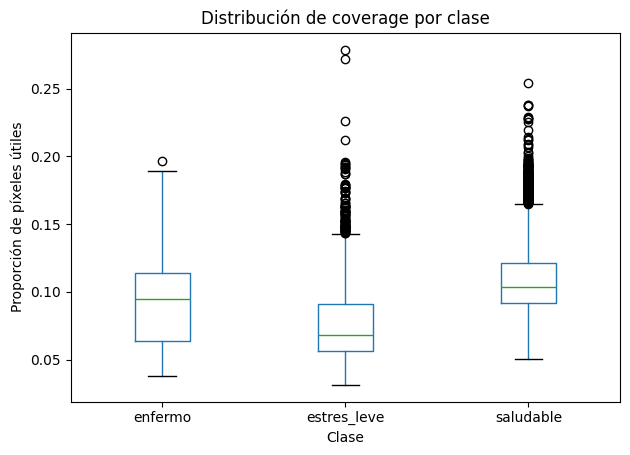

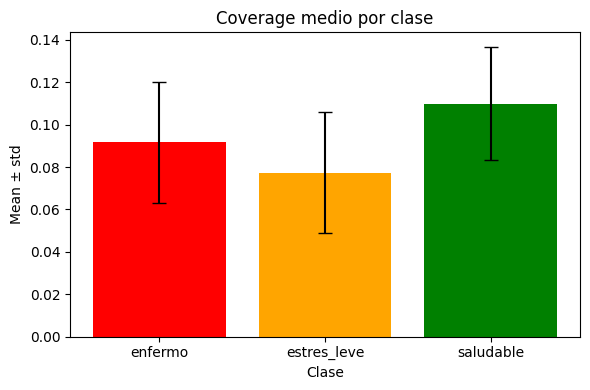

In [5]:
# ============================
# EJEMPLO DE EJECUCIÓN Y GRÁFICOS
# ============================

# 1) Ejecutar el cálculo
df_cov = compute_coverage_direct(
    label_csv=label_csv,
    raw_img_dir="../data/images",
    desplazar_arriba=hp["desplazar_arriba"],
    timestamp_rect=hp["timestamp_rect"],
    clahe_clip_limit=hp["clahe_clip_limit"],
    clahe_tile_grid_size=hp["clahe_tile_grid_size"],
    hsv_ranges=hp["hsv_ranges"],
    lab_ranges=hp["lab_ranges"],
    min_contour_area=hp["min_contour_area"],
    watershed_dist_thresh=hp["watershed_dist_thresh"]
)

# 2) Resumen estadístico
summary = df_cov.groupby('class')['coverage'].describe().round(3)
print("Cobertura por clase:")
print(summary)

# 3) Boxplot
plt.figure(figsize=(8,6))
df_cov.boxplot(column='coverage', by='class', grid=False)
plt.suptitle('')
plt.title('Distribución de coverage por clase')
plt.xlabel('Clase')
plt.ylabel('Proporción de píxeles útiles')
plt.tight_layout()
plt.show()

# 4) Bar chart media ± std
stats = df_cov.groupby('class')['coverage'].agg(['mean','std'])
plt.figure(figsize=(6,4))
plt.bar(stats.index, stats['mean'], yerr=stats['std'], capsize=5,
        color=['red','orange','green'])
plt.title('Coverage medio por clase')
plt.xlabel('Clase')
plt.ylabel('Mean ± std')
plt.tight_layout()
plt.show()

### Ejecución general del script para guardar imágenes preprocesadas

In [5]:
# ========================
# Ejecución del script para guardar imágenes preprocesadas
# ========================

preprocess_and_save_dataset(
    label_csv=label_csv,
    raw_img_dir="../data/images",
    output_dir="../data/images_preproc",
    desplazar_arriba=hp["desplazar_arriba"],
    timestamp_rect=hp["timestamp_rect"],
    clahe_clip_limit=hp["clahe_clip_limit"],
    clahe_tile_grid_size=hp["clahe_tile_grid_size"],
    hsv_ranges=hp["hsv_ranges"],
    lab_ranges=hp["lab_ranges"],
    min_contour_area=hp["min_contour_area"],
    watershed_dist_thresh=hp["watershed_dist_thresh"],
    final_size=hp["final_size"]
)


Preprocesando imágenes:  71%|███████   | 10093/14185 [14:00<07:44,  8.80it/s]

⚠️ Error procesando 2021-11-18_09-47-13_10s.jpg: OpenCV(4.11.0) :-1: error: (-5:Bad argument) in function 'rectangle'
> Overload resolution failed:
>  - Layout of the output array img is incompatible with cv::Mat
>  - Layout of the output array img is incompatible with cv::Mat
>  - Expected Ptr<cv::UMat> for argument 'img'
>  - Expected Ptr<cv::UMat> for argument 'img'



Preprocesando imágenes: 100%|██████████| 14185/14185 [19:32<00:00, 12.10it/s]



✅ Preprocesamiento completo. Imágenes guardadas en: ../data/images_preproc
